In [1]:
import os
import librosa
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPool2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.image import resize
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
random_song = "Music data/blues/blues.00000.wav"

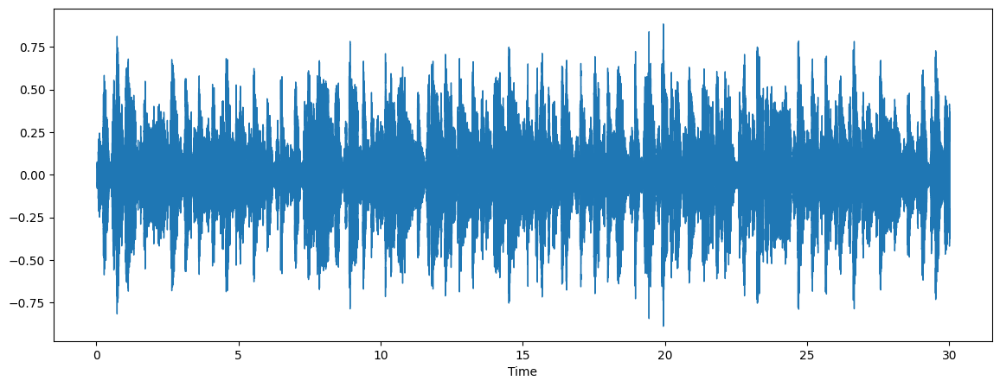

In [3]:
x, sr = librosa.load(random_song, sr = 44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(x, sr=sr)

In [4]:
from IPython.display import Audio
Audio(data=x, rate=sr)

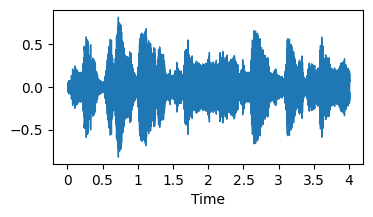

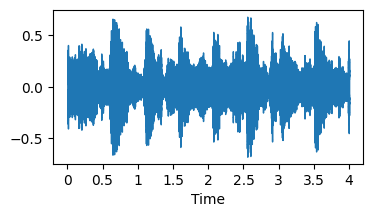

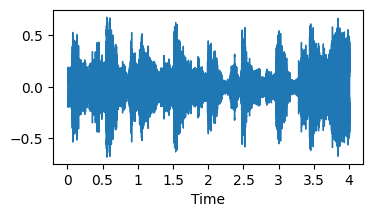

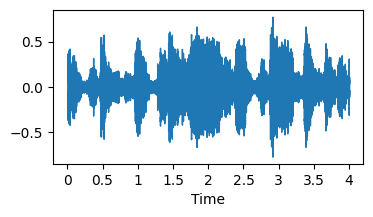

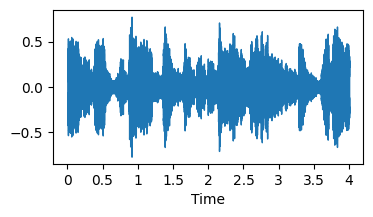

...

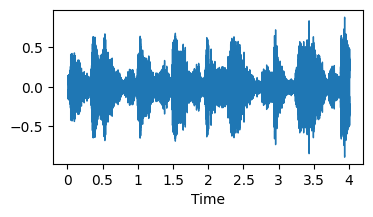

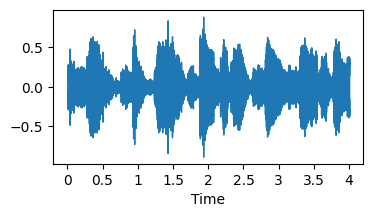

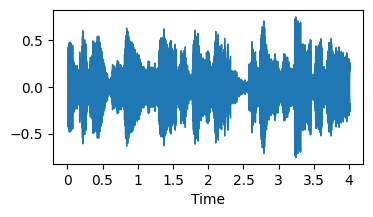

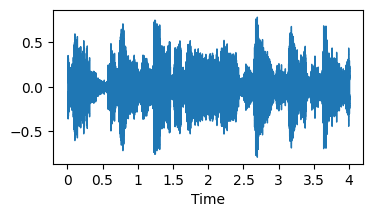

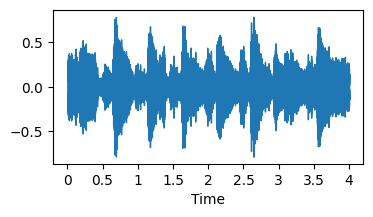

In [5]:
audio_path = "Music data/blues/blues.00000.wav"
y, sr = librosa.load(audio_path, sr=None)
chunk_duration = 4
overlap_duration = 2
chunk_samples = chunk_duration * sr
overlap_samples = overlap_duration * sr
num_chunks = int(np.ceil((len(y) - chunk_samples) / (chunk_samples - overlap_samples))) - 1
for i in range(num_chunks):
    start = i * (chunk_samples - overlap_samples)
    end = start + chunk_samples
    chunk = y[start:end]
    plt.figure(figsize=(4,2))
    librosa.display.waveshow(chunk, sr=sr)
    plt.show

In [6]:
def plot_melspectrogram(y,sr):
    spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
    spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)
    plt.figure(figsize = (10,4))
    librosa.display.specshow(spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.tight_layout()
    plt.show()

In [7]:
def plot_melspectrogram_chunks(y,sr):
    chunck_duration = 4
    overlap_duration = 2
    chunk_samples = chunk_duration * sr
    overlap_samples = overlap_duration * sr
    num_chunks = int(np.ceil((len(y) - chunk_samples) / (chunk_samples - overlap_samples))) - 1
    for i in range(num_chunks):
        start = i * (chunk_samples - overlap_samples)
        end = start + chunk_samples
        chunk = y[start:end]
        mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sr)
        print(mel_spectrogram.shape)
        spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)
        plt.figure(figsize = (10,4))
        librosa.display.specshow(spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Spectrogram')
        plt.tight_layout()
        plt.show()

(128, 173)


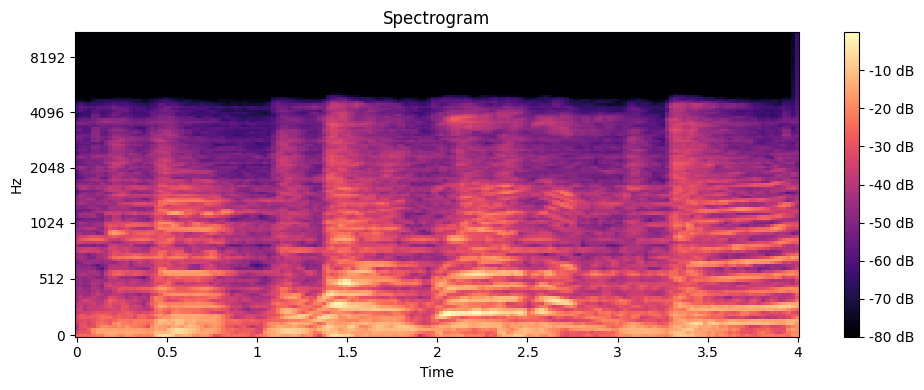

(128, 173)


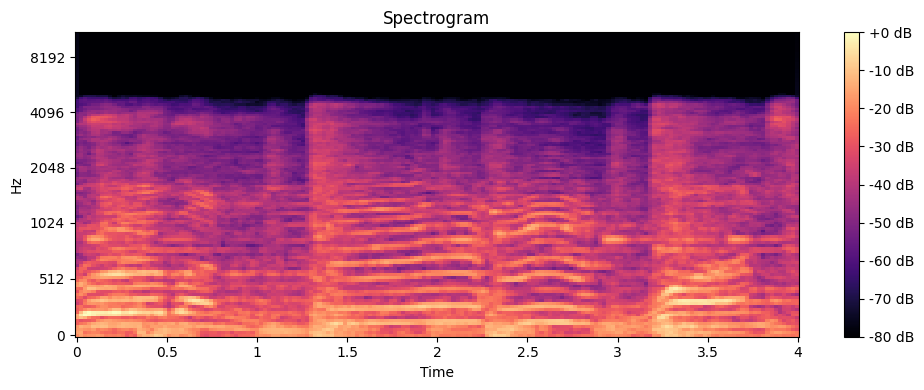

(128, 173)


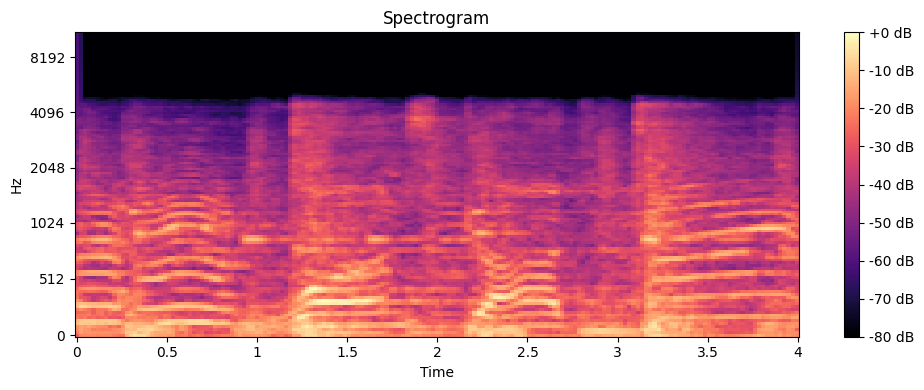

(128, 173)


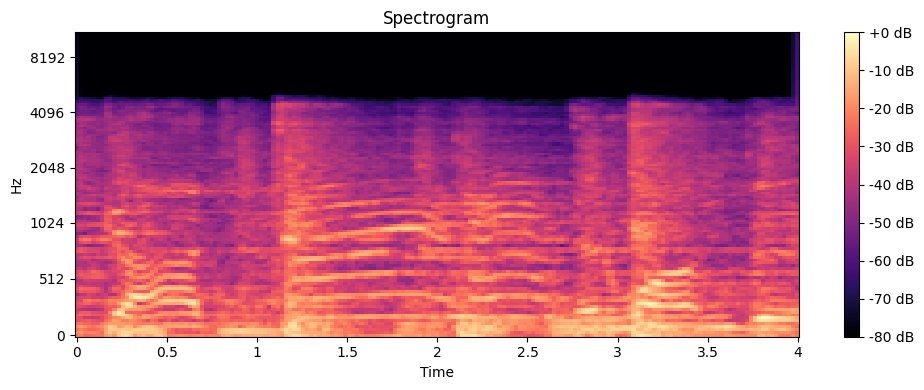

(128, 173)


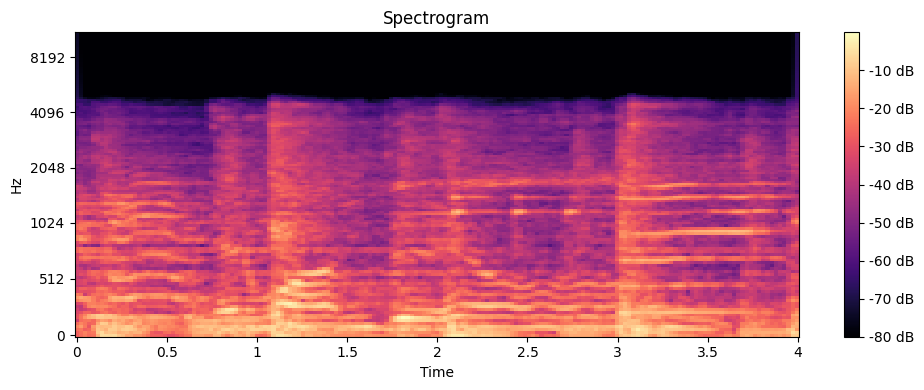

(128, 173)


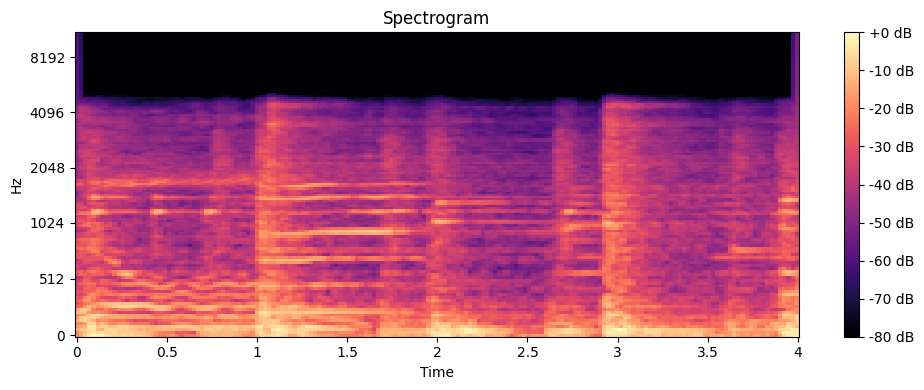

(128, 173)


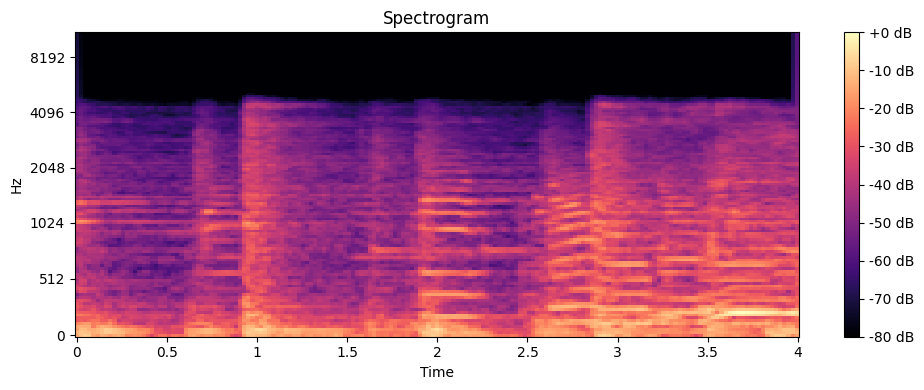

(128, 173)


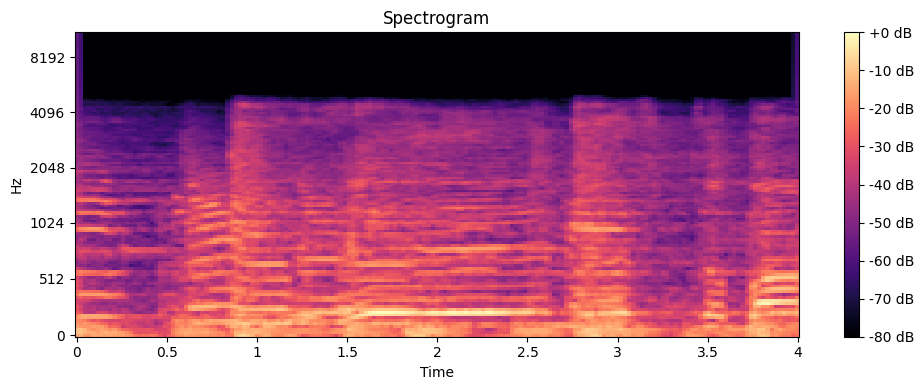

(128, 173)


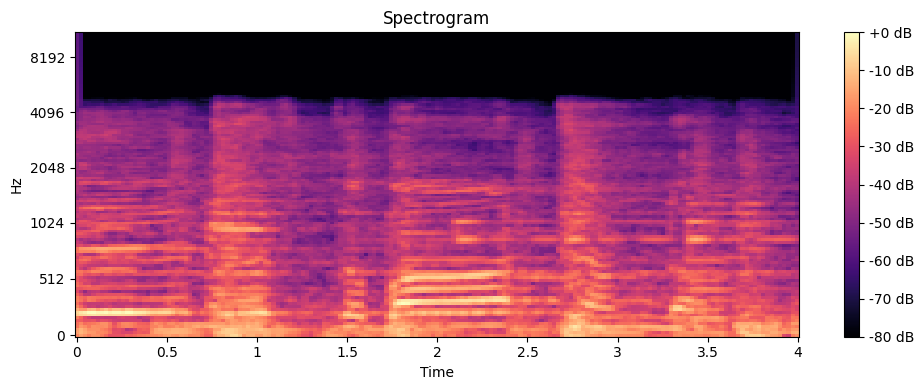

(128, 173)


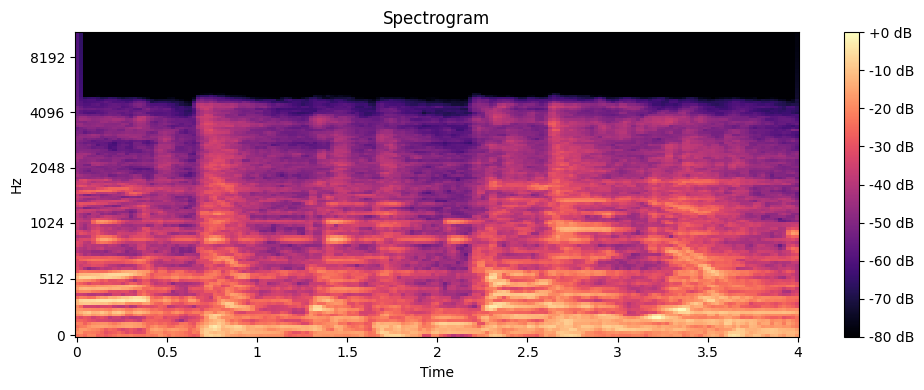

(128, 173)


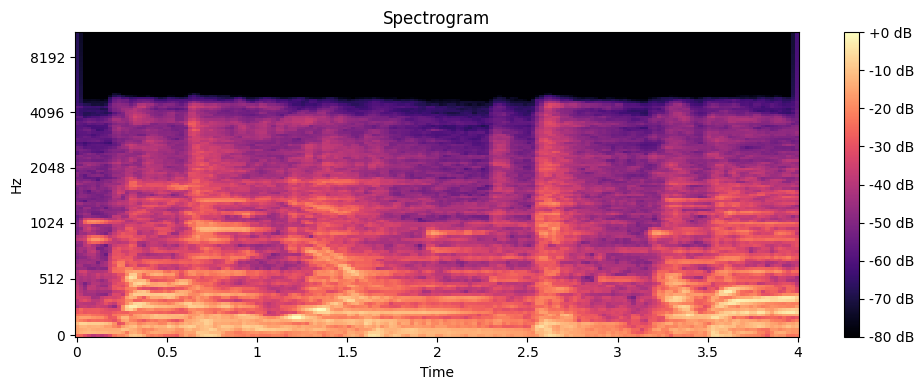

(128, 173)


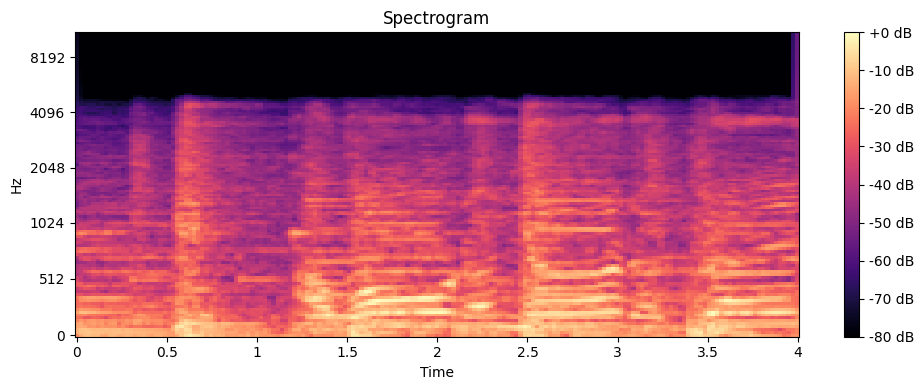

(128, 173)


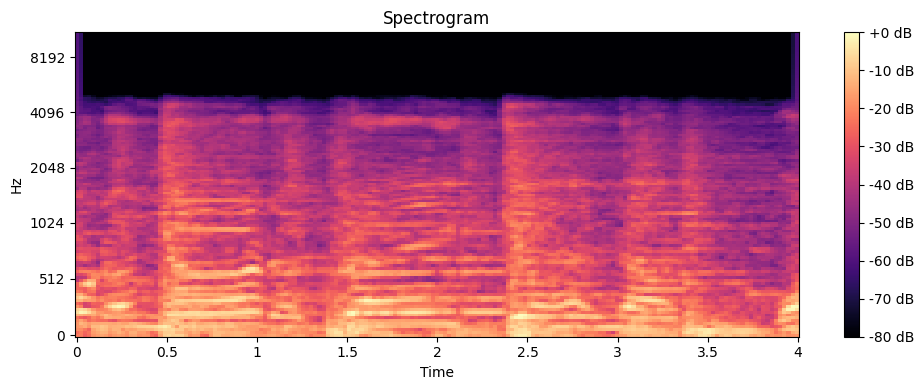

(128, 173)


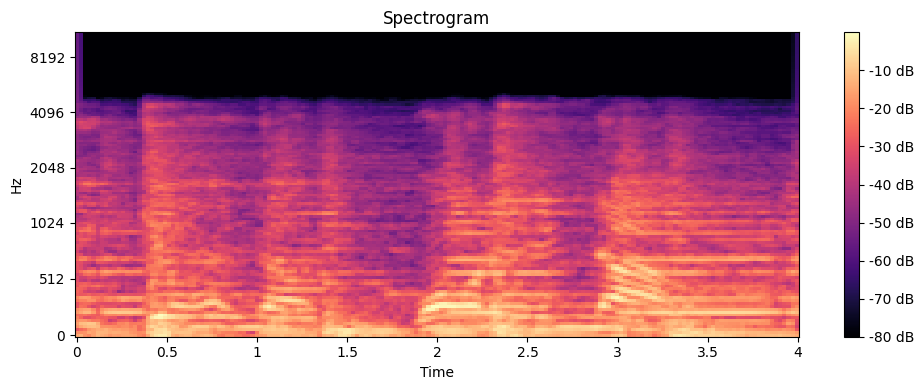

(128, 173)


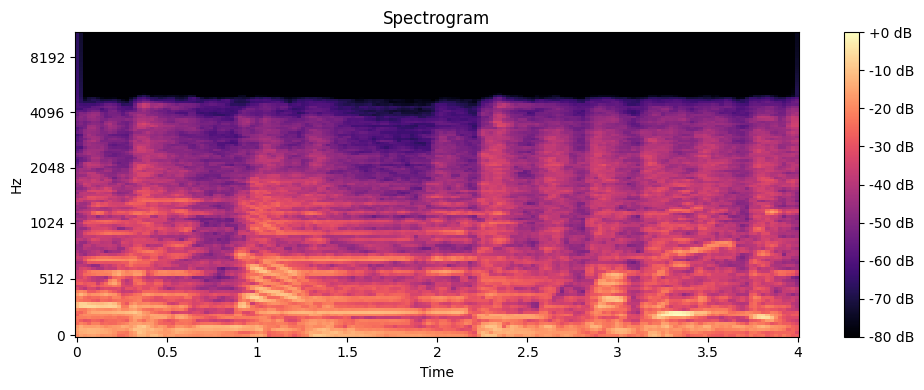

(128, 173)


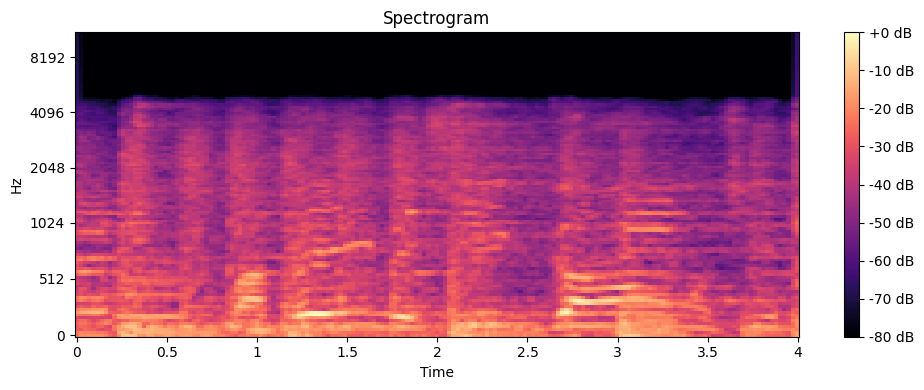

(128, 173)


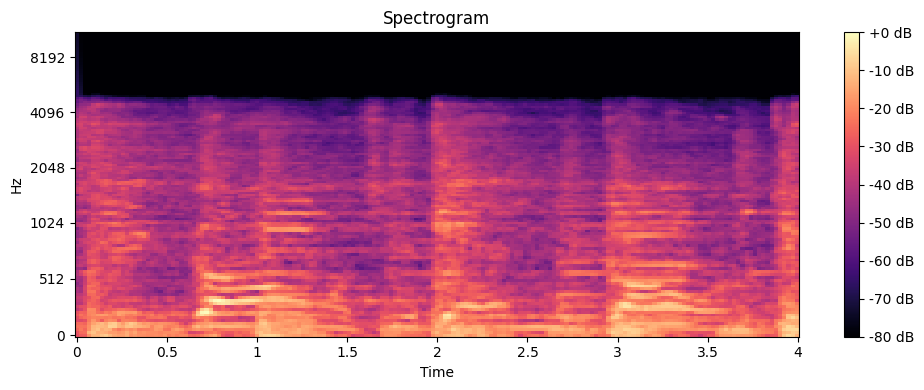

(128, 173)


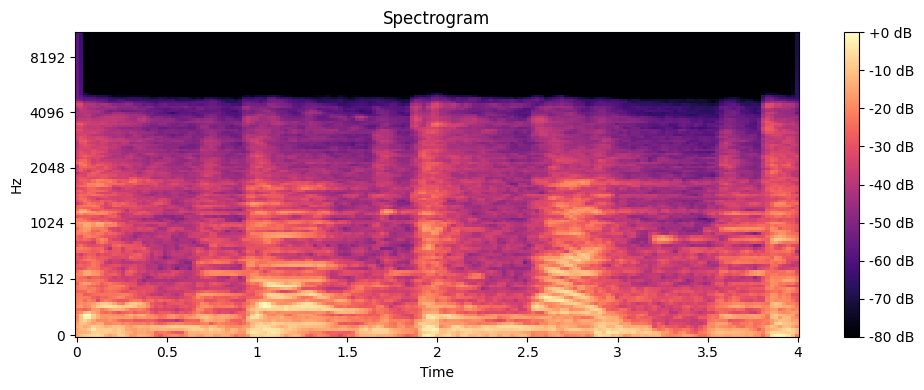

(128, 173)


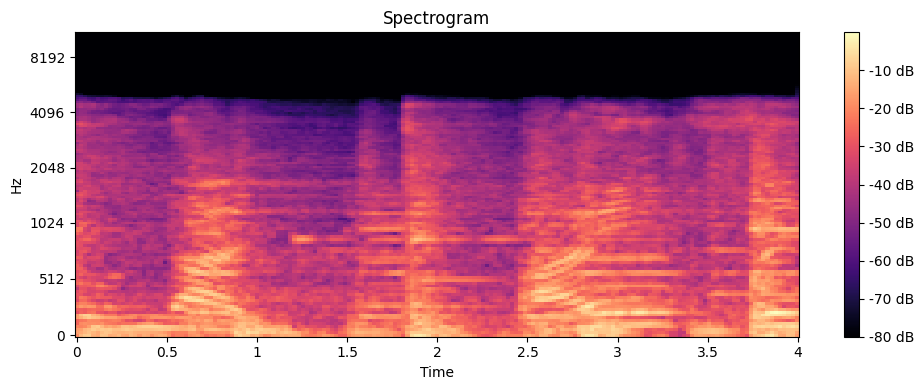

(128, 173)


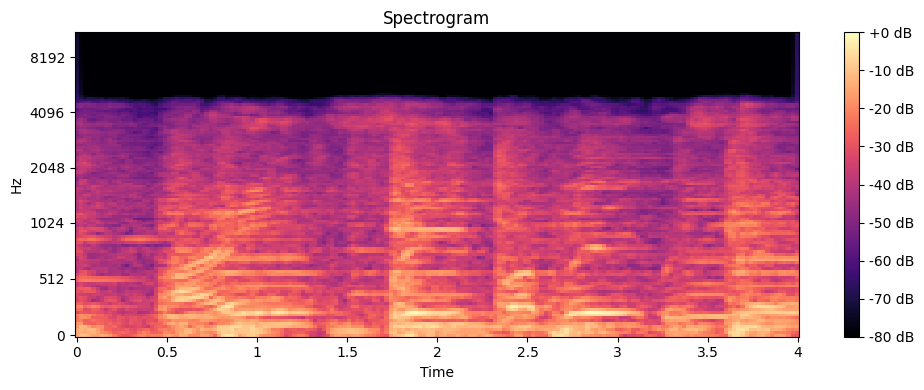

(128, 173)


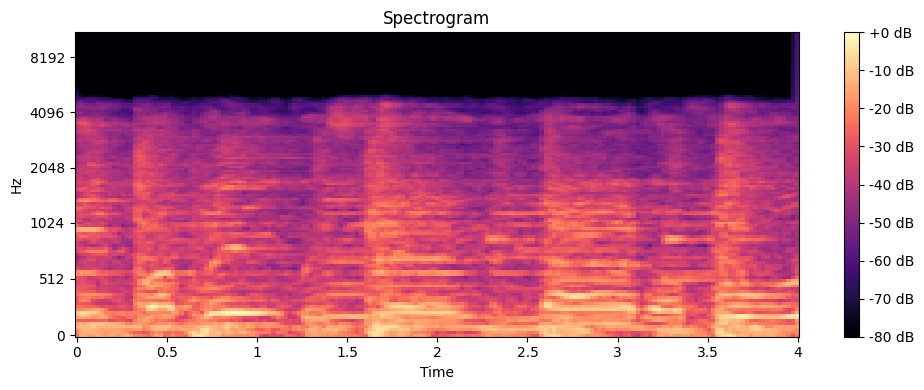

(128, 173)


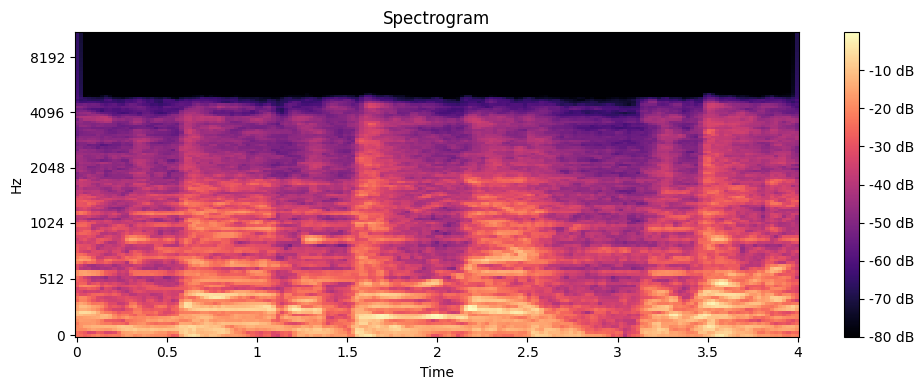

(128, 173)


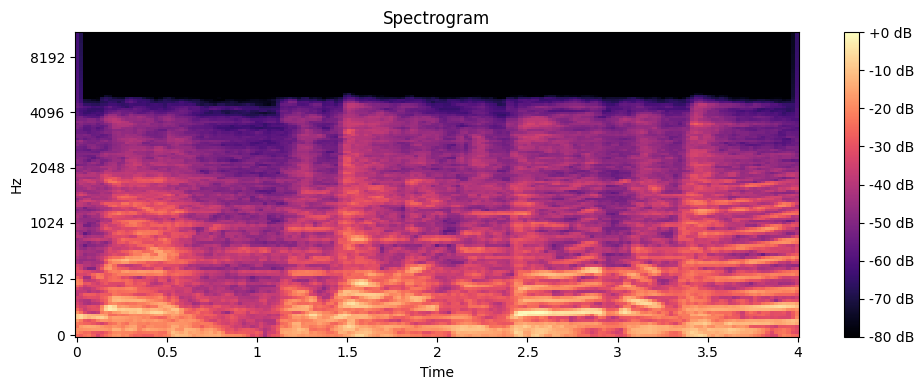

(128, 173)


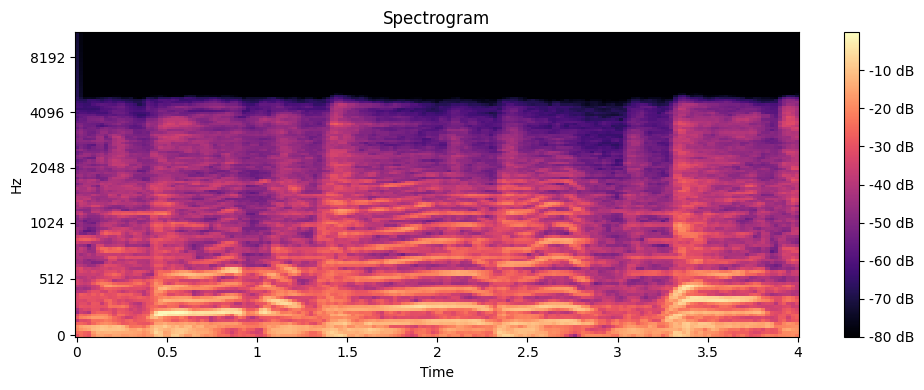

(128, 173)


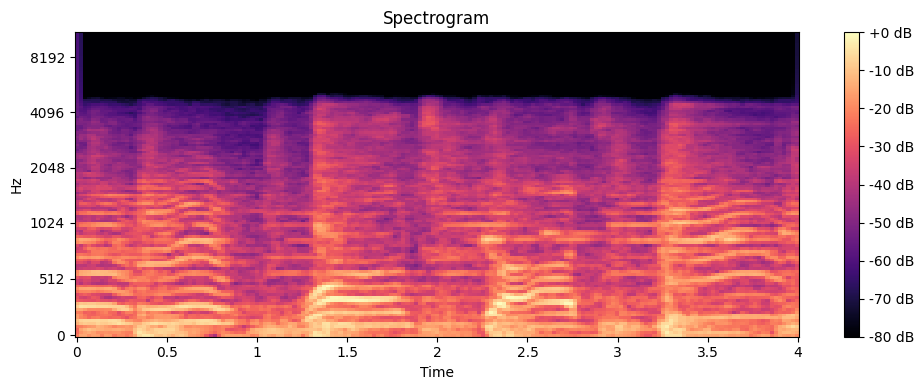

(128, 173)


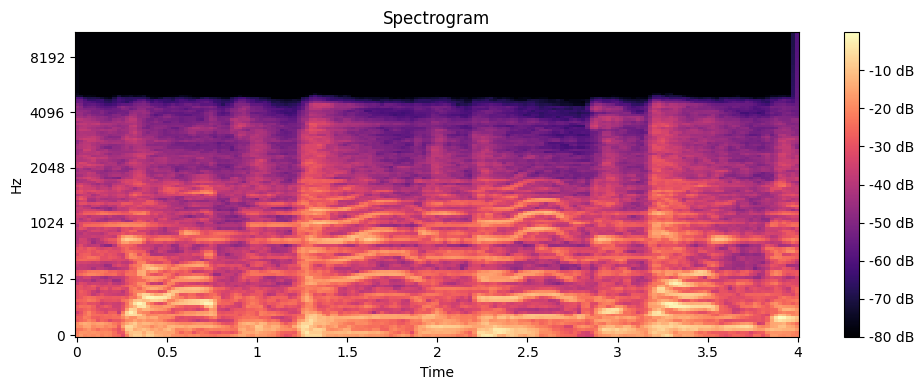

(128, 173)


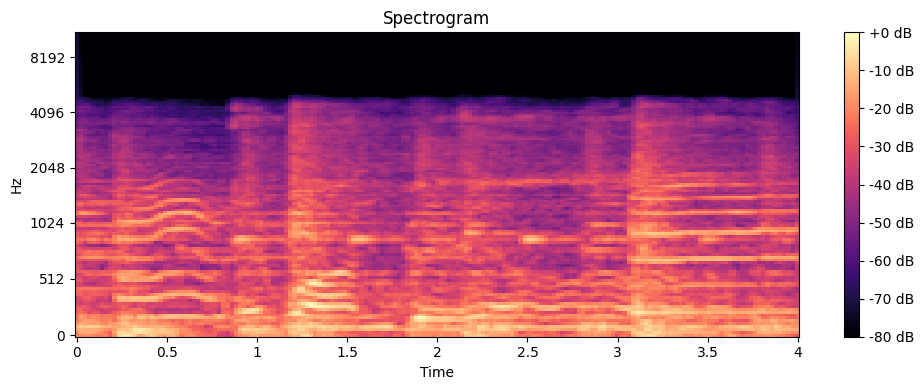

(128, 173)


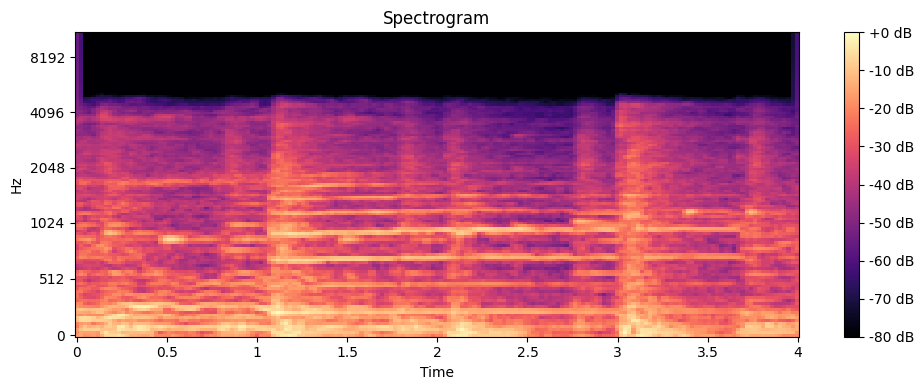

In [8]:
plot_melspectrogram_chunks(y=x, sr=sr)

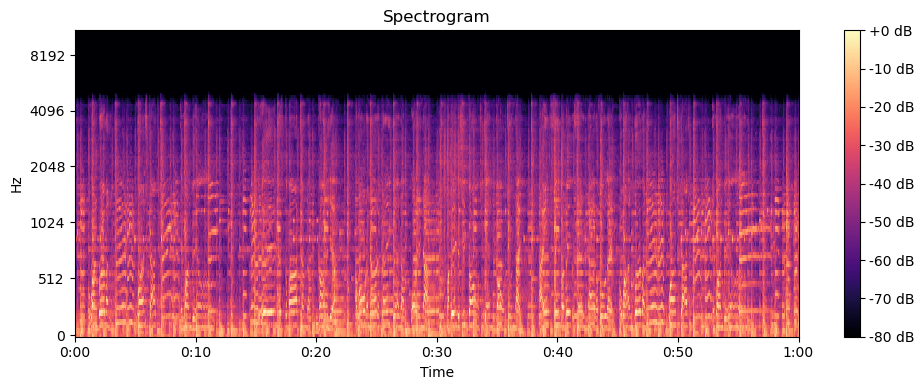

In [9]:
plot_melspectrogram (y=x, sr=sr)

In [9]:
data_dir = 'Music data'
classes = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

In [10]:
from tensorflow.image import resize
def load_and_preprocess_data(data_dir,classes,target_shape=(150,150)):
    data=[]
    labels=[]

    for i_class,class_name in enumerate(classes):
        class_dir = os.path.join(data_dir,class_name)
        print("Processing--",class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith('.wav'):
                file_path = os.path.join(class_dir,filename)
                audio_data,sample_rate = librosa.load(file_path,sr=None)
                chunk_duration = 4
                overlap_duration = 2
                chunk_samples = chunk_duration * sample_rate
                overlap_samples = overlap_duration * sample_rate
                num_chunks = int(np.ceil((len(audio_data)-chunk_samples)/(chunk_samples-overlap_samples)))+1
                for i in range(num_chunks):
                    start = i*(chunk_samples-overlap_samples)
                    end = start+chunk_samples
                    chunk = audio_data[start:end]
                    mel_spectrogram = librosa.feature.melspectrogram(y=chunk,sr=sample_rate)
                    mel_spectrogram = resize(np.expand_dims(mel_spectrogram,axis=-1),target_shape)
                    data.append(mel_spectrogram)
                    labels.append(i_class)
    return np.array(data),np.array(labels)

In [11]:
data,labels = load_and_preprocess_data(data_dir,classes)

Processing-- blues
Processing-- classical
Processing-- country
Processing-- disco
Processing-- hiphop
Processing-- jazz
Processing-- metal
Processing-- pop
Processing-- reggae
Processing-- rock


In [12]:
data.shape

(14975, 150, 150, 1)

In [13]:
labels.shape

(14975,)

In [14]:
labels

array([0, 0, 0, ..., 9, 9, 9])

In [15]:
from tensorflow.keras.utils import to_categorical
labels = to_categorical(labels,num_classes = len(classes)) # Converting labels to one-hot encoding
labels

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [16]:
labels.shape

(14975, 10)

In [17]:
data.shape

(14975, 150, 150, 1)

In [18]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

In [19]:
model = tf.keras.models.Sequential()

In [20]:
x_train[0].shape

(150, 150, 1)

In [21]:
model.add(Conv2D(filters=32, kernel_size=3, padding='same', activation='relu', input_shape=x_train[0].shape))
model.add(Conv2D(filters=32, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))

In [22]:
model.add(Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=64, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))

In [23]:
model.add(Conv2D(filters=128, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=128, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))

In [24]:
model.add(tf.keras.layers.Dropout(0.3))

In [25]:
model.add(Conv2D(filters=256, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=256, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))

In [26]:
model.add(Conv2D(filters=512, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=512, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))

In [27]:
model.add(Dropout(0.3))

In [28]:
model.add(Flatten())

In [29]:
model.add(Dense(units=1200, activation='relu'))

In [30]:
model.add(Dropout(0.45))

In [31]:
model.add(Dense(units=len(classes), activation='softmax'))

In [32]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 150, 150, 32)      320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 148, 148, 32)      9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 74, 74, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 72, 72, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 36, 36, 128)       7

In [33]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [34]:
x_train.shape, y_train.shape

((11980, 150, 150, 1), (11980, 10))

In [35]:
training_history = model.fit(x_train, y_train, epochs=30, batch_size=32, validation_data=(x_test, y_test))

Epoch 1/30
375/375 [==============================] - 15s 27ms/step - loss: 1.9998 - accuracy: 0.2546 - val_loss: 1.6691 - val_accuracy: 0.4140
Epoch 2/30
375/375 [==============================] - 9s 25ms/step - loss: 1.4735 - accuracy: 0.4801 - val_loss: 1.1986 - val_accuracy: 0.5840
Epoch 3/30
375/375 [==============================] - 9s 25ms/step - loss: 1.1671 - accuracy: 0.5935 - val_loss: 1.1448 - val_accuracy: 0.5883
Epoch 4/30
375/375 [==============================] - 9s 25ms/step - loss: 0.9834 - accuracy: 0.6640 - val_loss: 0.9426 - val_accuracy: 0.6731
Epoch 5/30
375/375 [==============================] - 9s 25ms/step - loss: 0.8622 - accuracy: 0.7043 - val_loss: 0.8048 - val_accuracy: 0.7389
Epoch 6/30
375/375 [==============================] - 9s 25ms/step - loss: 0.7172 - accuracy: 0.7576 - val_loss: 0.6618 - val_accuracy: 0.7840
Epoch 7/30
375/375 [==============================] - 9s 25ms/step - loss: 0.6014 - accuracy: 0.7959 - val_loss: 0.6117 - val_accuracy: 0.795

In [36]:
model.save("Trained_model.keras")
model.save("Trained_model.h5")

In [37]:
training_history.history

{'loss': [1.9998382329940796,
  1.4735244512557983,
  1.1670854091644287,
  0.9833722710609436,
  0.8621602654457092,
  0.7171571850776672,
  0.6014148592948914,
  0.5157116651535034,
  0.44507187604904175,
  0.36082252860069275,
  0.33093157410621643,
  0.26026463508605957,
  0.2458985149860382,
  0.20488980412483215,
  0.17966127395629883,
  0.16708971560001373,
  0.129632830619812,
  0.12203732132911682,
  0.10657824575901031,
  0.09903088957071304,
  0.10726825147867203,
  0.09286564588546753,
  0.08943279832601547,
  0.07737919688224792,
  0.07247379422187805,
  0.06298969686031342,
  0.05787127465009689,
  0.06588335335254669,
  0.05934251472353935,
  0.05512825399637222],
 'accuracy': [0.2545909881591797,
  0.48005008697509766,
  0.5934891700744629,
  0.6640233993530273,
  0.7043405771255493,
  0.7575960159301758,
  0.7959098219871521,
  0.826043426990509,
  0.8505008220672607,
  0.8791319131851196,
  0.8871452212333679,
  0.9112687706947327,
  0.9151920080184937,
  0.9309682846

In [38]:
import json
with open('training_hist.json', 'w') as f:
    json.dump(training_history.history, f)

In [39]:
training_accuracy = model.evaluate(x_train, y_train, verbose = 0)
print(training_accuracy[1])

0.9954090118408203


In [40]:
test_accuracy = model.evaluate(x_test, y_test, verbose=0)
print(test_accuracy[1])

0.9075125455856323


In [41]:
model = tf.keras.models.load_model("Trained_model.h5")
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 150, 150, 32)      320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 148, 148, 32)      9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 74, 74, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 72, 72, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 36, 36, 128)       7

In [42]:
import json
with open("training_hist.json",'r') as json_file:
    training_history_data = json.load(json_file)

In [43]:
training_history_data.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [44]:
train_loss,train_accuracy = model.evaluate(x_train,y_train)

375/375 [==============================] - 3s 8ms/step - loss: 0.0145 - accuracy: 0.9954


In [45]:
train_loss,train_accuracy

(0.014510667882859707, 0.9954090118408203)

In [46]:
val_loss,val_accuracy = model.evaluate(x_test,y_test)

94/94 [==============================] - 1s 8ms/step - loss: 0.3955 - accuracy: 0.9075


In [47]:
val_loss,val_accuracy

(0.3954676389694214, 0.9075125455856323)

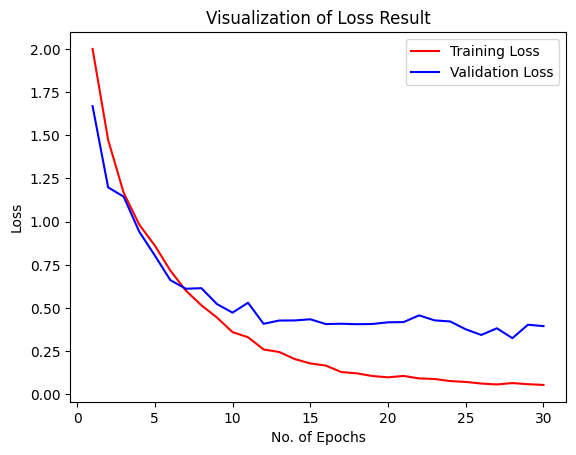

In [48]:
epochs = [i for i in range(1,31)]
plt.plot(epochs,training_history_data['loss'],label="Training Loss",color='red')
plt.plot(epochs,training_history_data['val_loss'],label="Validation Loss",color='blue')
plt.xlabel("No. of Epochs")
plt.ylabel("Loss")
plt.title("Visualization of Loss Result")
plt.legend()
plt.show()

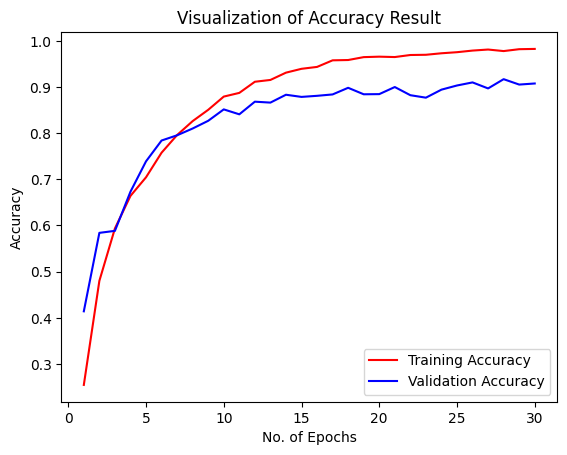

In [49]:
epochs = [i for i in range(1,31)]
plt.plot(epochs,training_history_data['accuracy'],label="Training Accuracy",color='red')
plt.plot(epochs,training_history_data['val_accuracy'],label="Validation Accuracy",color='blue')
plt.xlabel("No. of Epochs")
plt.ylabel("Accuracy")
plt.title("Visualization of Accuracy Result")
plt.legend()
plt.show()

In [50]:
x_test.shape

(2995, 150, 150, 1)

In [51]:
y_pred = model.predict(x_test)
y_pred

array([[5.35710249e-04, 1.19777200e-04, 3.76455610e-05, ...,
        9.81425881e-01, 1.42782301e-04, 2.76184268e-03],
       [4.72788432e-12, 1.04913852e-16, 2.88549702e-13, ...,
        1.50426762e-15, 8.51712960e-13, 3.79971243e-06],
       [1.89467955e-11, 9.64772628e-14, 9.86432073e-13, ...,
        2.03902364e-11, 8.97440813e-13, 6.67527347e-05],
       ...,
       [9.99999762e-01, 1.63911034e-19, 3.20963034e-09, ...,
        1.06394154e-16, 2.74065853e-10, 2.14676859e-07],
       [2.62475834e-04, 9.95011687e-01, 2.90682801e-04, ...,
        1.63810953e-04, 4.81009367e-04, 4.20887722e-04],
       [1.24345172e-06, 1.13651340e-14, 4.62129397e-11, ...,
        5.82456887e-05, 1.38909102e-03, 7.11241300e-05]], dtype=float32)

In [52]:
y_pred.shape

(2995, 10)

In [53]:
predicted_categories = np.argmax(y_pred,axis=1)
predicted_categories

array([7, 6, 6, ..., 0, 1, 4], dtype=int64)

In [54]:
y_test

array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [55]:
y_test.shape

(2995, 10)

In [56]:
true_categories = np.argmax(y_test,axis=1)
true_categories

array([7, 6, 6, ..., 0, 1, 4], dtype=int64)

In [57]:
classes

['blues',
 'classical',
 'country',
 'disco',
 'hiphop',
 'jazz',
 'metal',
 'pop',
 'reggae',
 'rock']

In [58]:
from sklearn.metrics import confusion_matrix,classification_report
cm = confusion_matrix(true_categories,predicted_categories)
print(classification_report(true_categories,predicted_categories,target_names=classes))

              precision    recall  f1-score   support

       blues       0.95      0.91      0.93       302
   classical       0.94      0.97      0.95       298
     country       0.87      0.82      0.85       317
       disco       0.93      0.90      0.91       312
      hiphop       0.91      0.95      0.93       277
        jazz       0.91      0.95      0.93       311
       metal       0.98      0.96      0.97       302
         pop       0.94      0.82      0.88       289
      reggae       0.86      0.93      0.89       296
        rock       0.80      0.88      0.84       291

    accuracy                           0.91      2995
   macro avg       0.91      0.91      0.91      2995
weighted avg       0.91      0.91      0.91      2995



In [59]:
cm

array([[275,   0,   6,   1,   1,   4,   0,   2,   7,   6],
       [  1, 288,   1,   0,   0,   6,   0,   0,   0,   2],
       [  5,   2, 261,   6,   0,  11,   0,   1,   9,  22],
       [  2,   3,   2, 280,   1,   0,   0,   4,  10,  10],
       [  0,   1,   0,   1, 263,   1,   3,   4,   2,   2],
       [  0,   8,   4,   0,   1, 295,   0,   0,   3,   0],
       [  0,   0,   2,   1,   1,   0, 290,   1,   0,   7],
       [  5,   3,  10,   1,  15,   4,   0, 236,   5,  10],
       [  2,   0,   3,   5,   7,   1,   0,   0, 275,   3],
       [  1,   2,  11,   7,   1,   1,   3,   2,   8, 255]], dtype=int64)

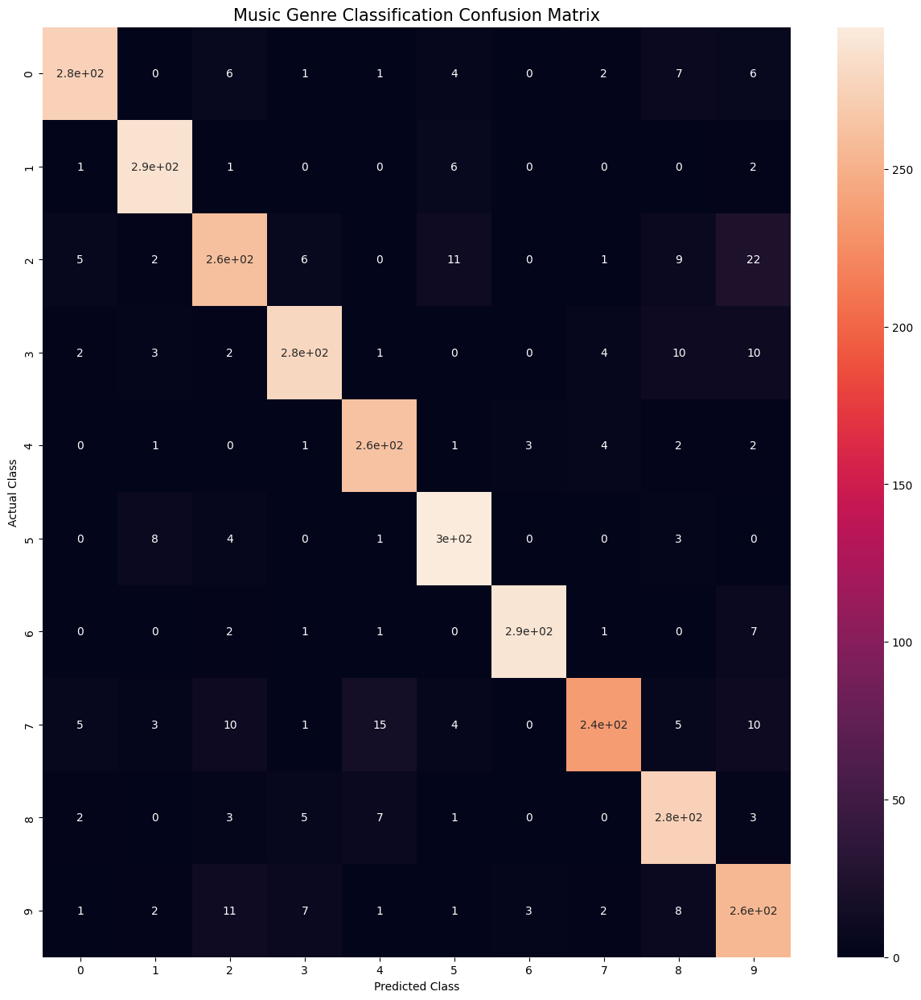

In [60]:
import seaborn as sns
plt.figure(figsize=(15,15))
sns.heatmap(cm,annot=True,annot_kws={"size":10})
plt.xlabel("Predicted Class",fontsize=10)
plt.ylabel("Actual Class",fontsize=10)
plt.title("Music Genre Classification Confusion Matrix",fontsize=15)
plt.show()

In [61]:
model = tf.keras.models.load_model("Trained_model.keras")

In [62]:
classes = ['blues', 'classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']

In [63]:
def load_and_preprocess_data(file_path, target_shape=(150, 150)):
    data = []
    audio_data, sample_rate = librosa.load(file_path, sr=None)
    chunk_duration = 4
    overlap_duration = 2
    chunk_samples = chunk_duration * sample_rate
    overlap_samples = overlap_duration * sample_rate
                
    num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1

    for i in range(num_chunks):
        start = i * (chunk_samples - overlap_samples)
        end = start + chunk_samples
        chunk = audio_data[start:end]
        mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sample_rate)
        mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), target_shape)
        data.append(mel_spectrogram)
    
    return np.array(data)

In [64]:
from IPython.display import Audio
file_path = "Music data/jazz/jazz.00020.wav"
y, sr = librosa.load(file_path, sr=44100)
Audio(data=y, rate=sr)

In [65]:
x_test = load_and_preprocess_data(file_path)

In [66]:
def model_prediction(x_test):
    y_pred = model.predict(x_test)
    predicted_categories = np.argmax(y_pred, axis=1)
    unique_elements, counts = np.unique(predicted_categories, return_counts=True)
    max_count = np.max(counts)
    max_elements = unique_elements[counts == max_count]
    return max_elements[0]

In [67]:
c_index = model_prediction(x_test)
print(f"Model Prediction :: Music Genre --> {classes[c_index]}")

Model Prediction :: Music Genre --> jazz
